In [2]:
import yfinance as yf
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [3]:
df_individual = pd.read_csv('individual_bank_data.csv')

C:\Users\Sailesh\AppData\Local\Temp\ipykernel_2176\3859142349.py:3: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  daily_returns = pivot_df_individual.pct_change()


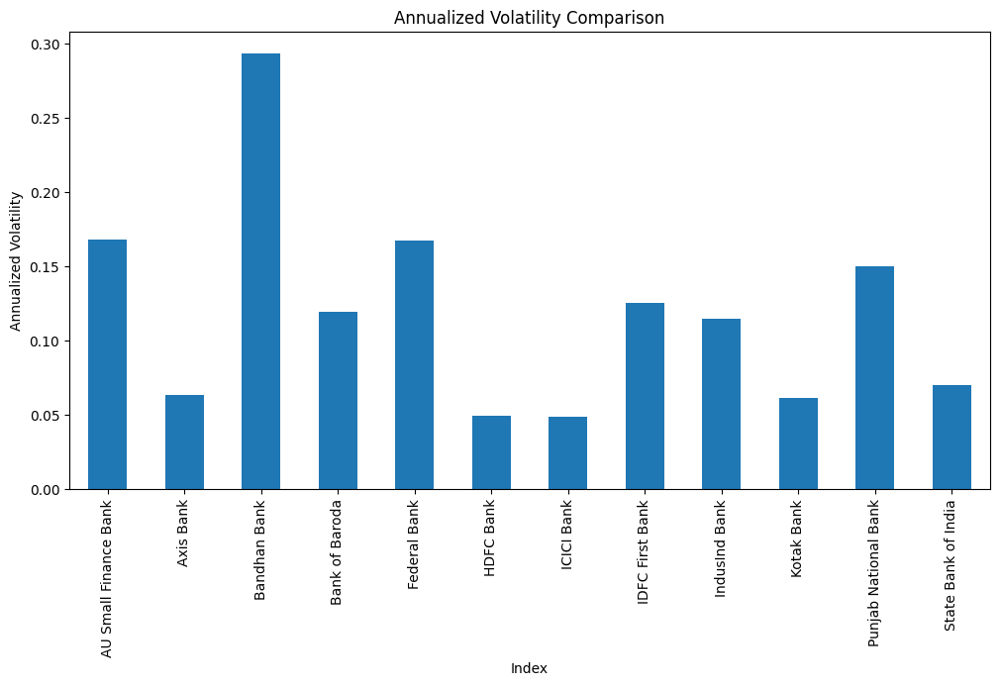

In [5]:
# Calculate daily returns
pivot_df_individual = df_individual.pivot_table(index=df_individual.index, columns='Index', values='Close')
daily_returns = pivot_df_individual.pct_change()

# Calculate annualized volatility
volatility = daily_returns.std() * (252**0.5)

plt.figure(figsize=(12, 6))
volatility.plot(kind='bar')
plt.title('Annualized Volatility Comparison')
plt.ylabel('Annualized Volatility')
plt.show()


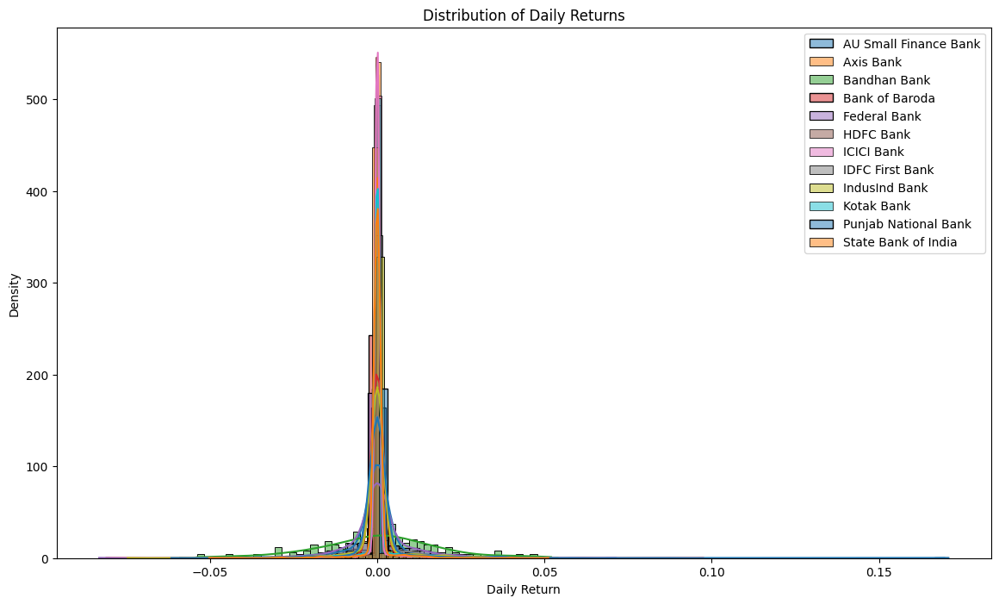

In [4]:
import seaborn as sns

plt.figure(figsize=(14, 8))
for bank in pivot_df_individual.columns:
    sns.histplot(daily_returns[bank].dropna(), kde=True, label=bank, stat='density', bins=50)
plt.xlabel('Daily Return')
plt.ylabel('Density')
plt.title('Distribution of Daily Returns')
plt.legend()
plt.show()


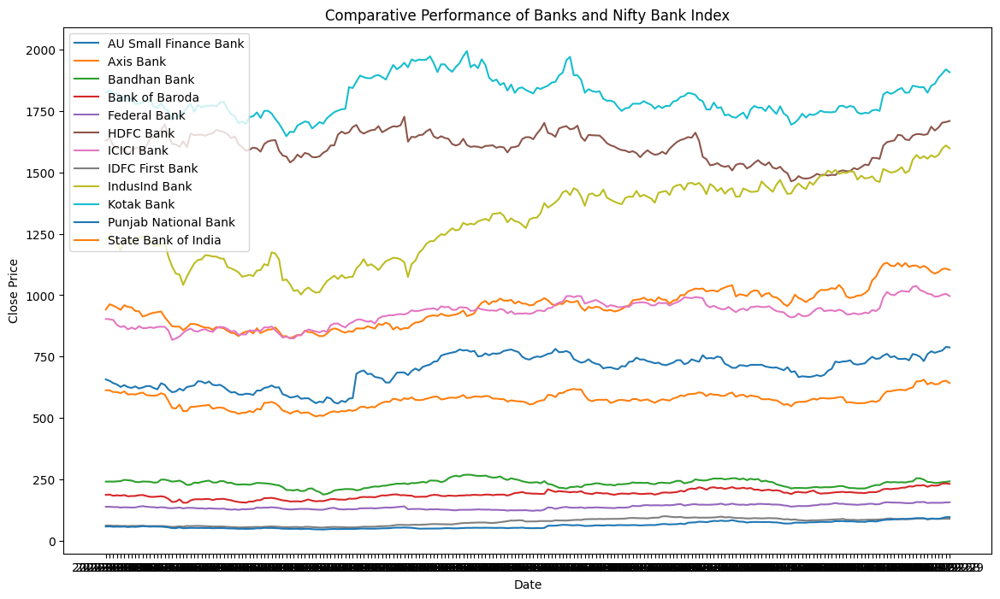

In [9]:
import matplotlib.pyplot as plt

# Pivot the df_individual for easier plotting
pivot_df_individual = df_individual.pivot_table(index=df_individual['Date'], columns='Index', values='Close')

plt.figure(figsize=(14, 8))
for bank in pivot_df_individual.columns:
    plt.plot(pivot_df_individual.index, pivot_df_individual[bank], label=bank)
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Comparative Performance of Banks and Nifty Bank Index')
plt.legend()
plt.show()


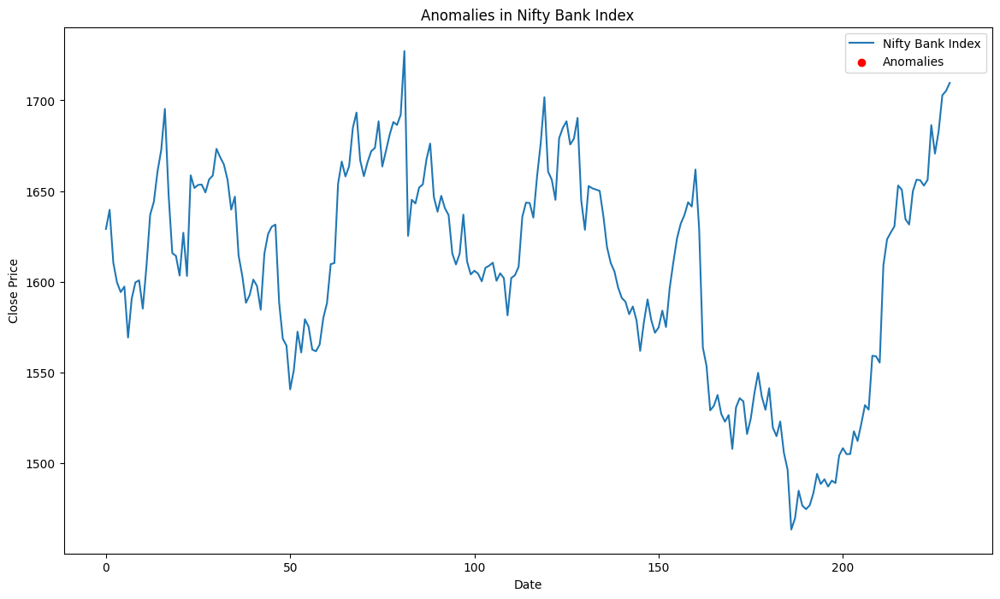

In [6]:
import numpy as np

# Identify anomalies using z-score
z_scores = np.abs((pivot_df_individual['HDFC Bank'] - pivot_df_individual['HDFC Bank'].mean()) / pivot_df_individual['HDFC Bank'].std())
anomalies = z_scores[z_scores > 3]

plt.figure(figsize=(14, 8))
plt.plot(pivot_df_individual.index, pivot_df_individual['HDFC Bank'], label='Nifty Bank Index')
plt.scatter(anomalies.index, anomalies, color='red', label='Anomalies')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Anomalies in Nifty Bank Index')
plt.legend()
plt.show()


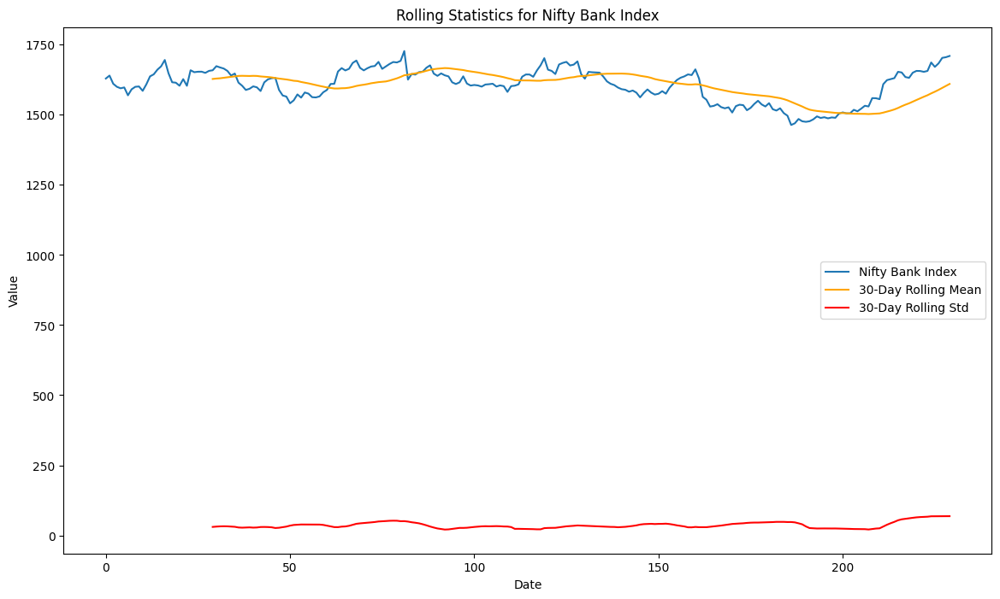

In [7]:
# Calculate rolling mean and standard deviation
pivot_df_individual['Rolling Mean'] = pivot_df_individual['HDFC Bank'].rolling(window=30).mean()
pivot_df_individual['Rolling Std'] = pivot_df_individual['HDFC Bank'].rolling(window=30).std()

plt.figure(figsize=(14, 8))
plt.plot(pivot_df_individual.index, pivot_df_individual['HDFC Bank'], label='Nifty Bank Index')
plt.plot(pivot_df_individual.index, pivot_df_individual['Rolling Mean'], label='30-Day Rolling Mean', color='orange')
plt.plot(pivot_df_individual.index, pivot_df_individual['Rolling Std'], label='30-Day Rolling Std', color='red')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Rolling Statistics for Nifty Bank Index')
plt.legend()
plt.show()


In [8]:
import pandas as pd
import numpy as np

# Calculate Z-scores
df_individual['Z-Score'] = (df_individual['Close'] - df_individual['Close'].mean()) / df_individual['Close'].std()

# Identify outliers
threshold = 3
outliers = df_individual[np.abs(df_individual['Z-Score']) > threshold]

print("Outliers based on Z-Score:")
print(outliers)


Outliers based on Z-Score:
Empty DataFrame
Columns: [Date, Index, Open, High, Low, Close, Z-Score]
Index: []


In [9]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df_individual['Close'].quantile(0.25)
Q3 = df_individual['Close'].quantile(0.75)
IQR = Q3 - Q1

# Determine outliers
outliers = df_individual[(df_individual['Close'] < (Q1 - 1.5 * IQR)) | (df_individual['Close'] > (Q3 + 1.5 * IQR))]

print("Outliers based on IQR:")
print(outliers)


Outliers based on IQR:
Empty DataFrame
Columns: [Date, Index, Open, High, Low, Close, Z-Score]
Index: []


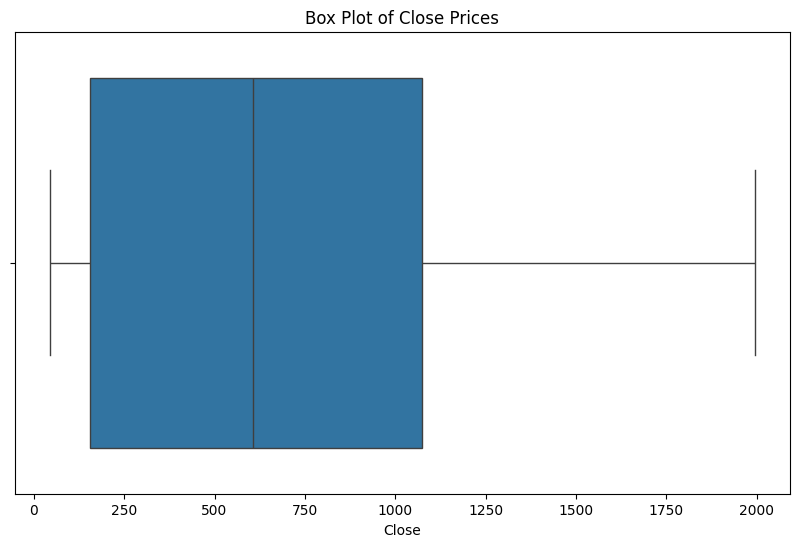

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(x=df_individual['Close'])
plt.title('Box Plot of Close Prices')
plt.show()


In [12]:
df = pd.read_csv('individual_bank_data.csv')

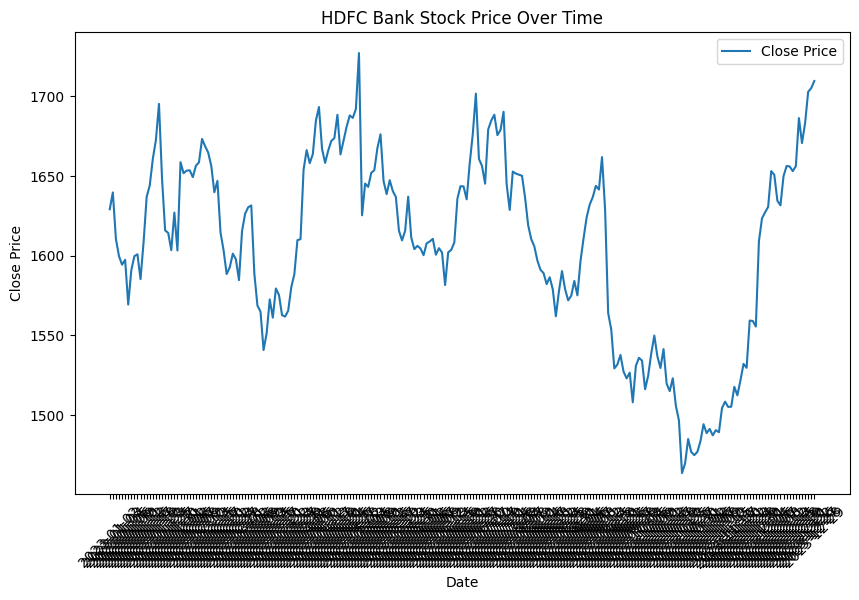

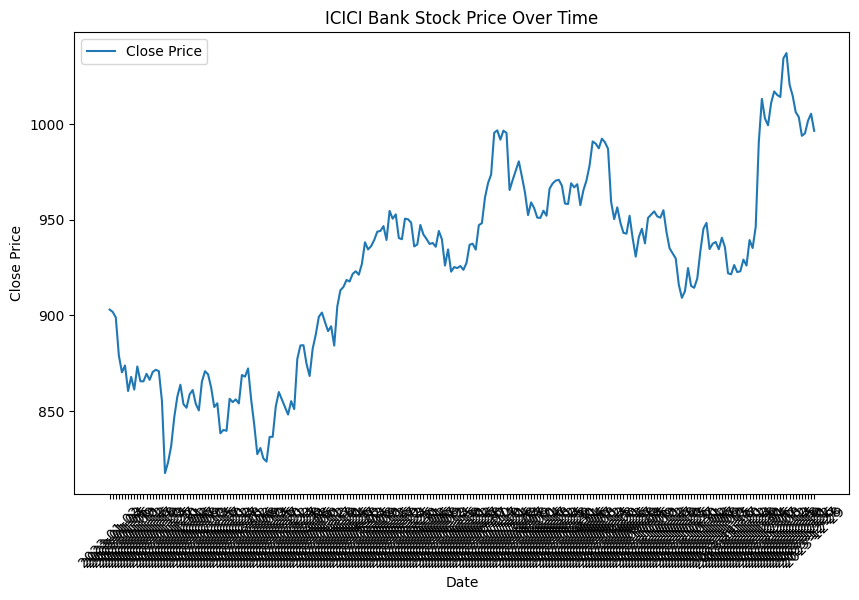

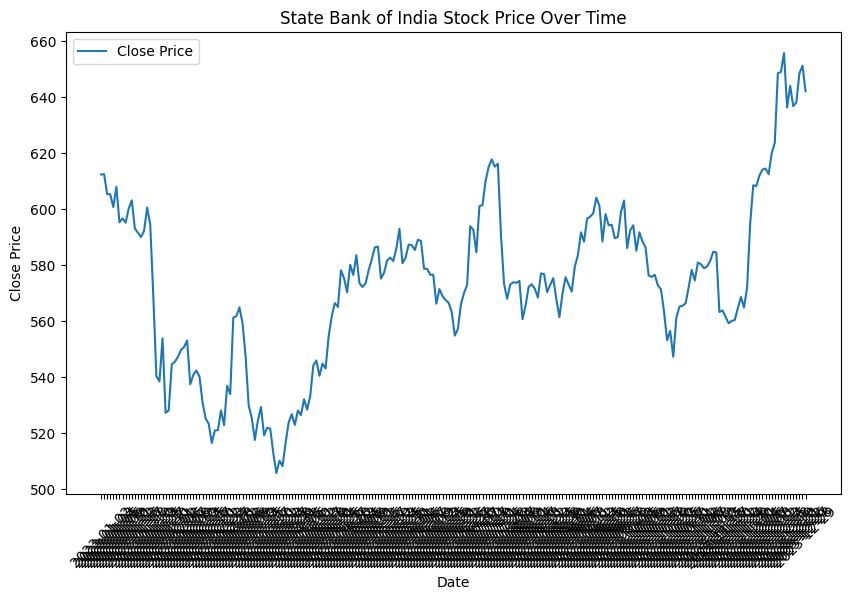

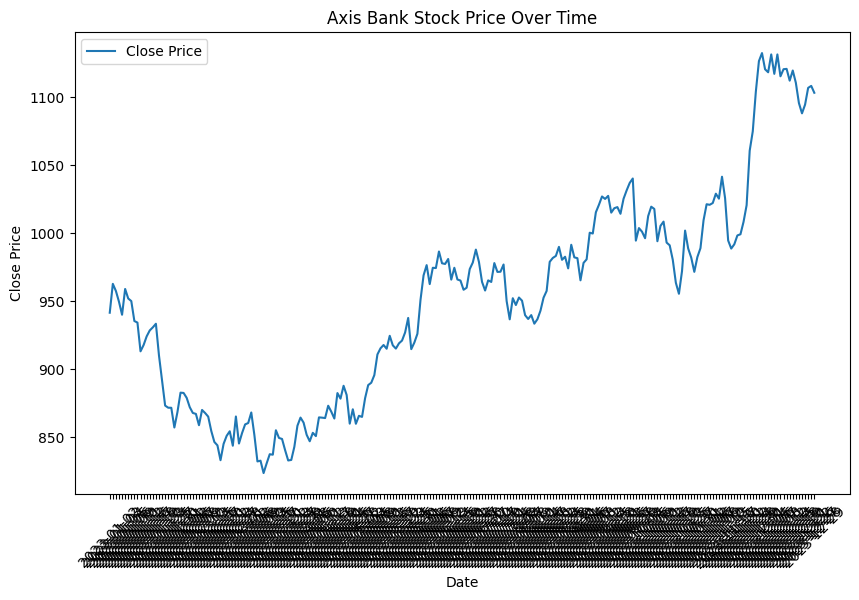

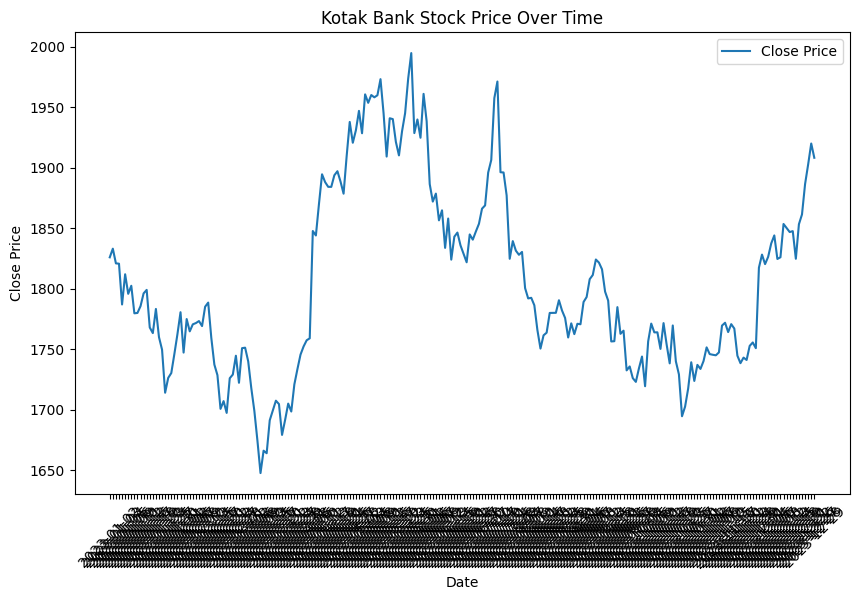

...

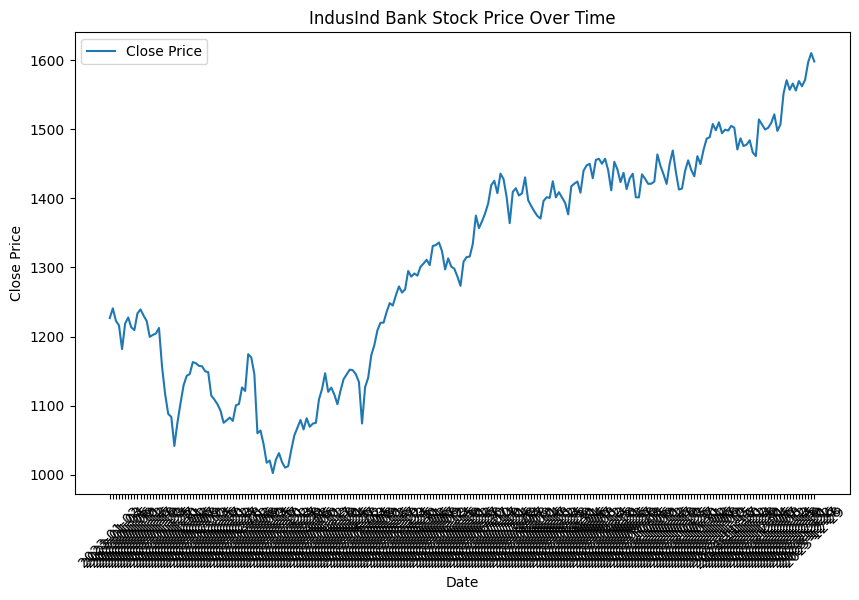

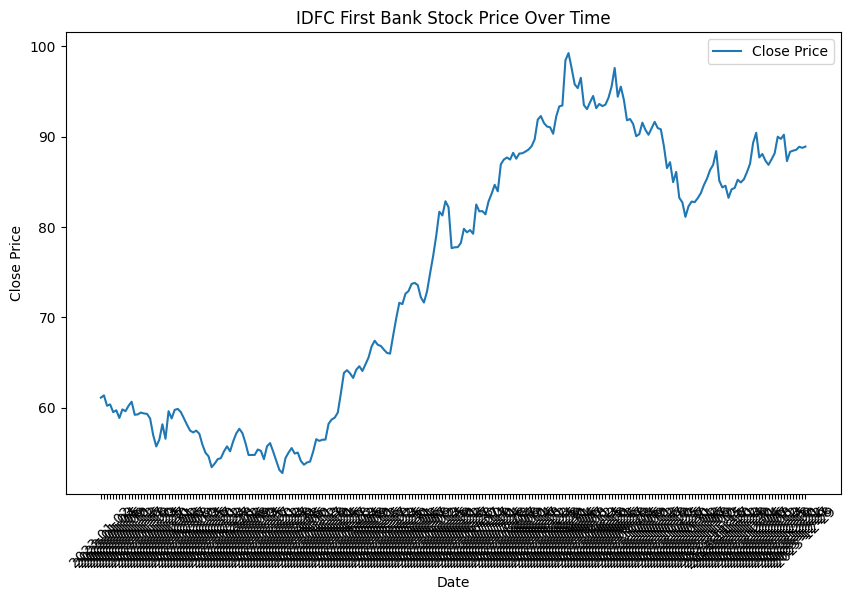

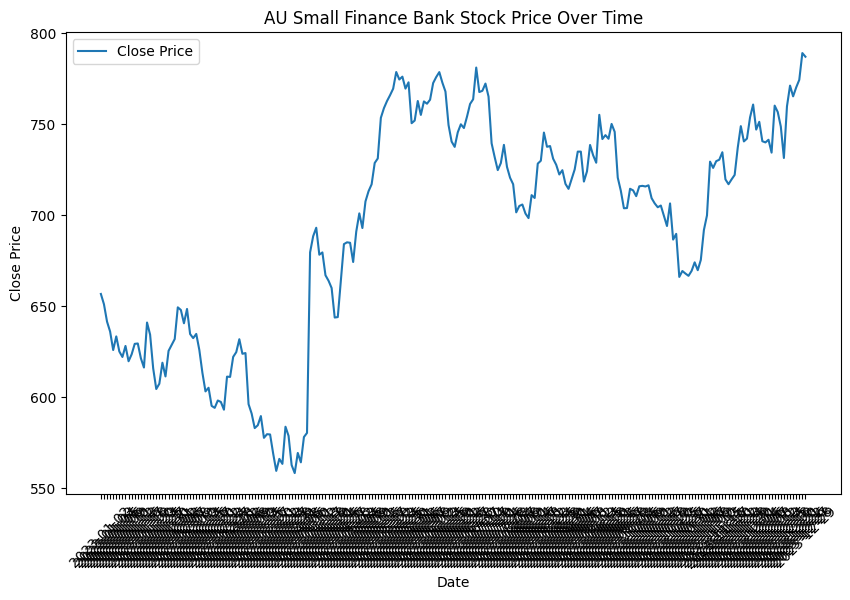

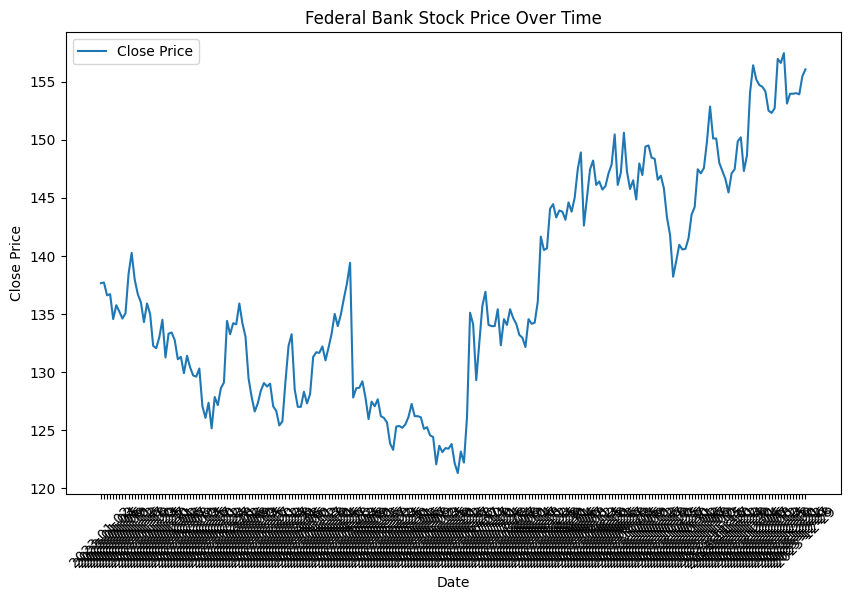

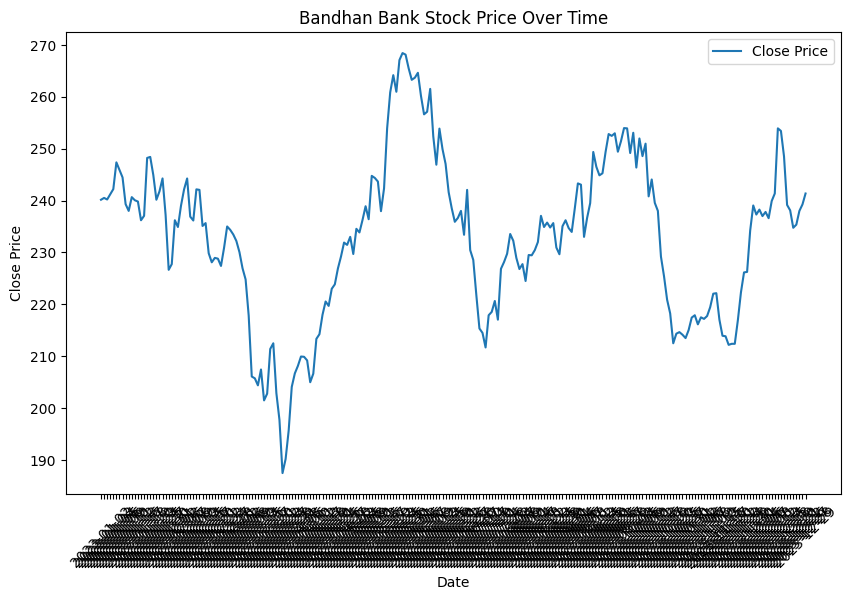

In [16]:
import matplotlib.pyplot as plt

# Line plot of stock prices over time
for Index in df['Index'].unique():
    Index_data = df[df['Index'] == Index]
    plt.figure(figsize=(10, 6))
    plt.plot(Index_data['Date'], Index_data['Close'], label='Close Price')
    plt.title(f'{Index} Stock Price Over Time')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()

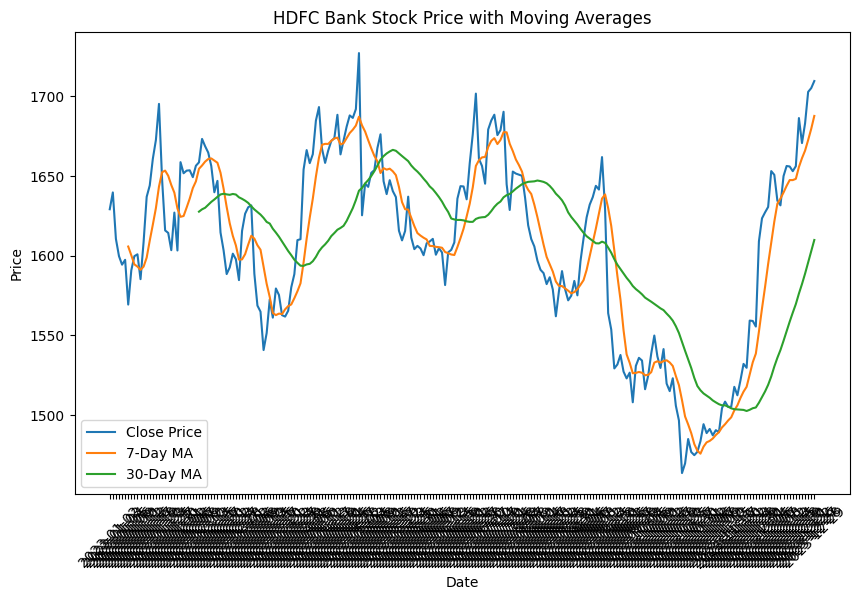

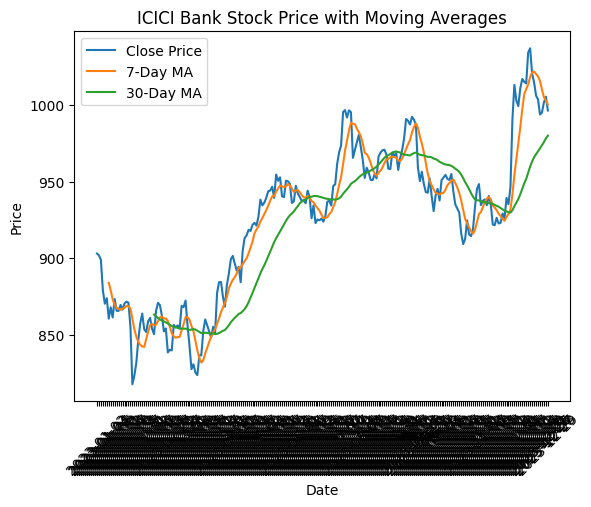

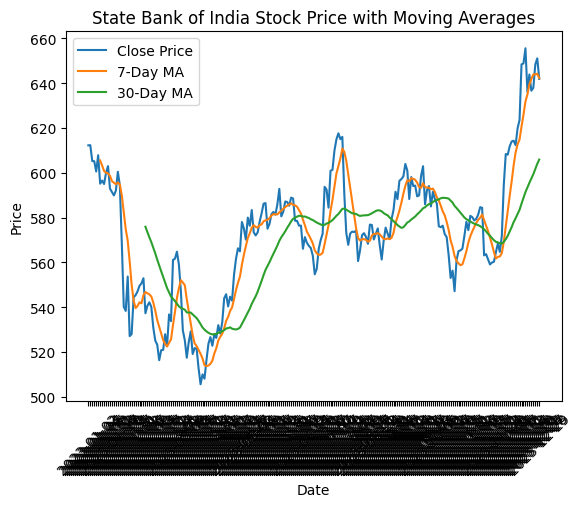

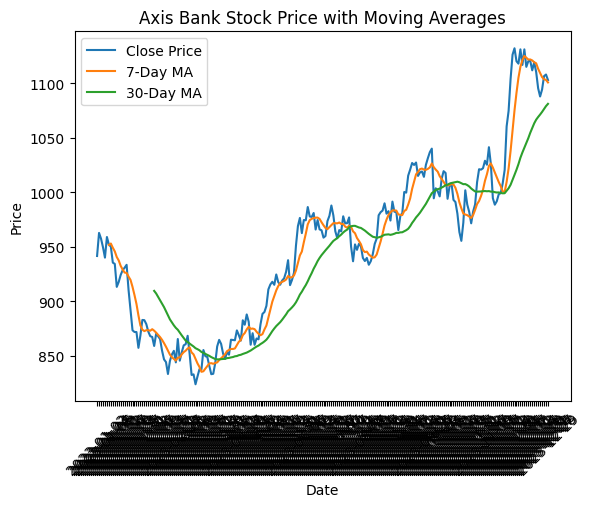

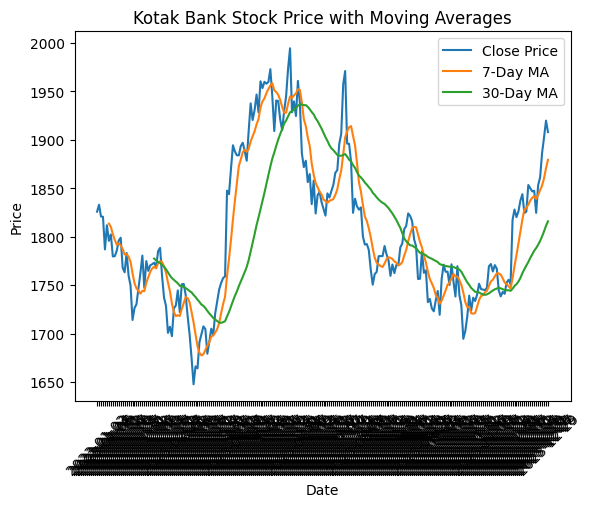

...

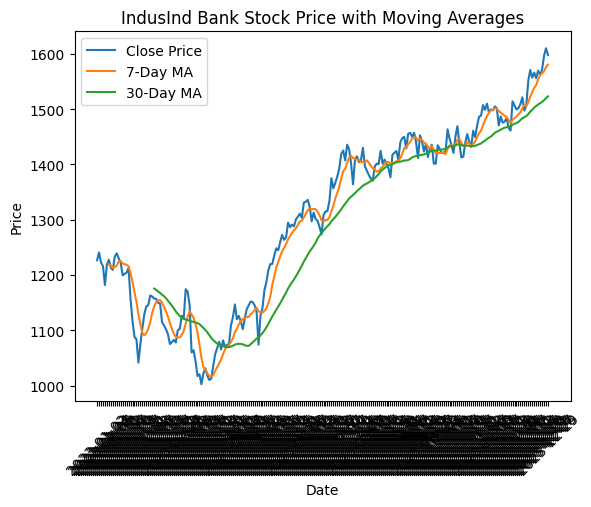

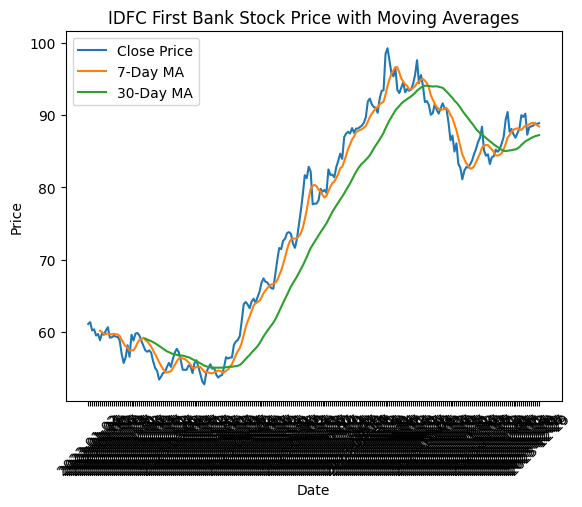

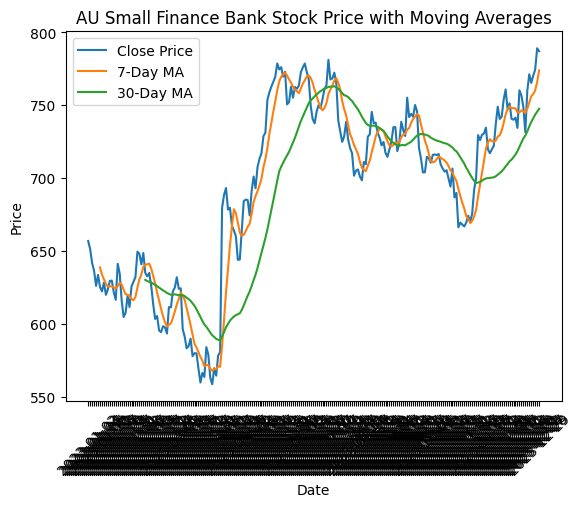

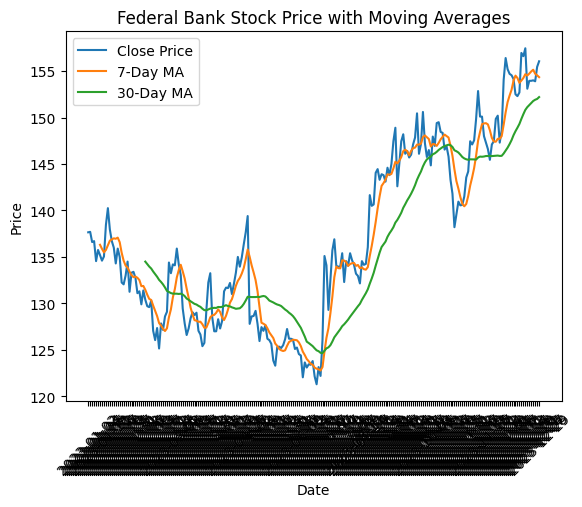

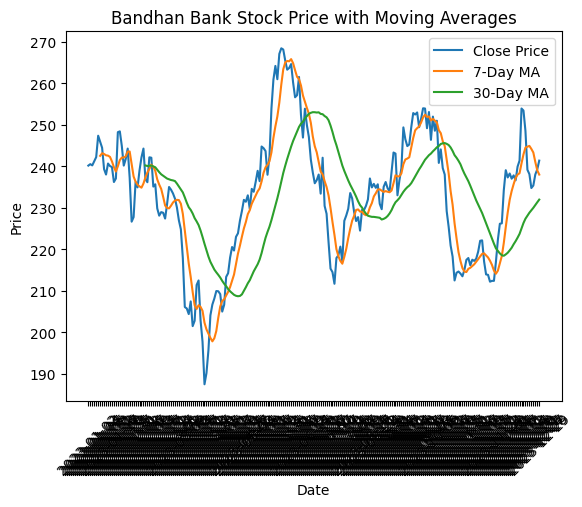

In [18]:
df['MA_7'] = df.groupby('Index')['Close'].transform(lambda x: x.rolling(window=7).mean())
df['MA_30'] = df.groupby('Index')['Close'].transform(lambda x: x.rolling(window=30).mean())

# Plot moving averages
plt.figure(figsize=(10, 6))
for Index in df['Index'].unique():
    Index_data = df[df['Index'] == Index]
    plt.plot(Index_data['Date'], Index_data['Close'], label='Close Price')
    plt.plot(Index_data['Date'], Index_data['MA_7'], label='7-Day MA')
    plt.plot(Index_data['Date'], Index_data['MA_30'], label='30-Day MA')
    plt.title(f'{Index} Stock Price with Moving Averages')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()


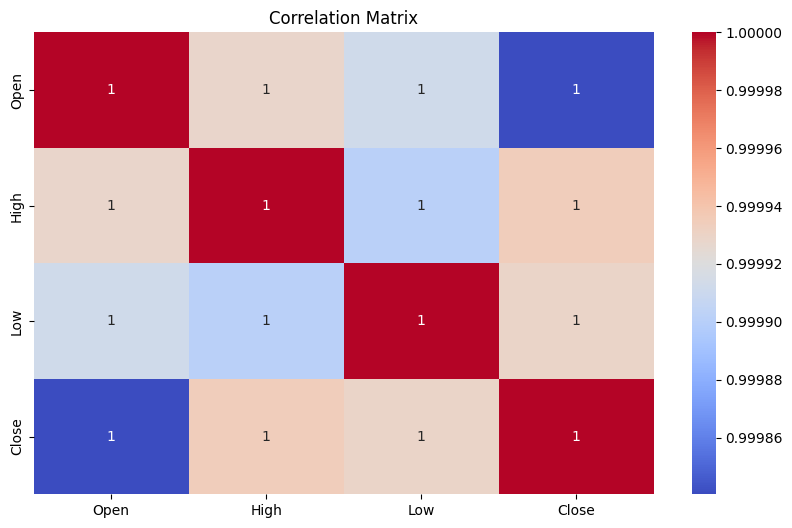

In [20]:
# Correlation matrix of numerical columns
correlation_matrix = df[['Open', 'High', 'Low', 'Close']].corr()

import seaborn as sns
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


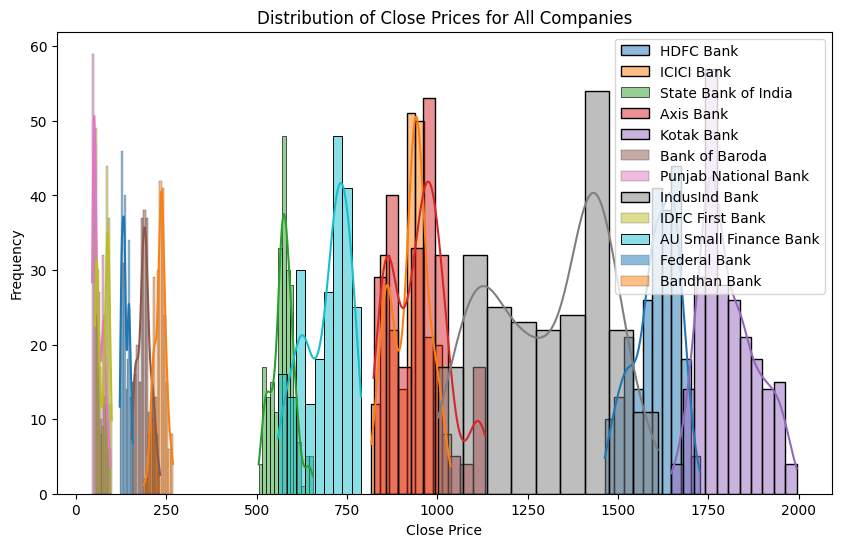

In [13]:
plt.figure(figsize=(10, 6))
for Index in df['Index'].unique():
    Index_data = df[df['Index'] == Index]
    sns.histplot(Index_data['Close'], kde=True, label=Index, alpha=0.5)  # Added alpha for transparency
plt.title('Distribution of Close Prices for All Companies')
plt.xlabel('Close Price')
plt.ylabel('Frequency')
plt.legend()
plt.show()


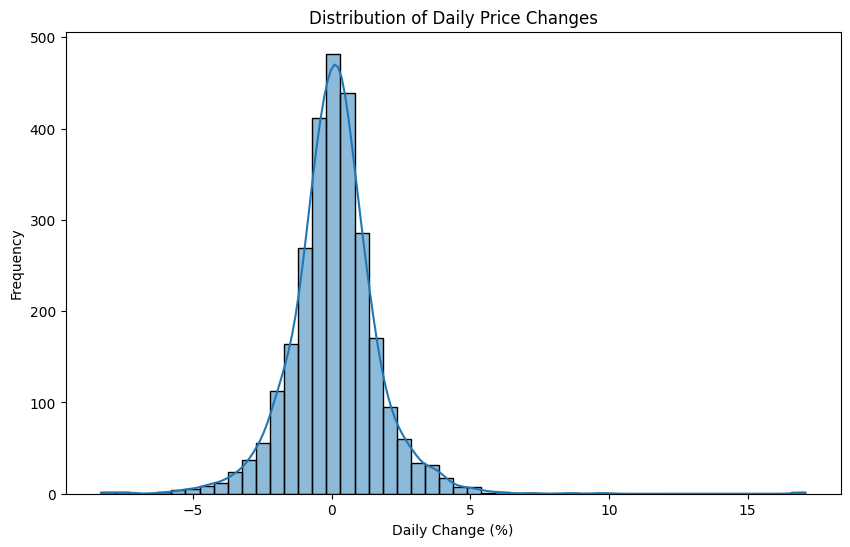

In [24]:
# Calculate daily percentage change in Close prices
df['Daily Change (%)'] = df.groupby('Index')['Close'].pct_change() * 100

# Histogram of daily changes
plt.figure(figsize=(10, 6))
sns.histplot(df['Daily Change (%)'], bins=50, kde=True)
plt.title('Distribution of Daily Price Changes')
plt.xlabel('Daily Change (%)')
plt.ylabel('Frequency')
plt.show()


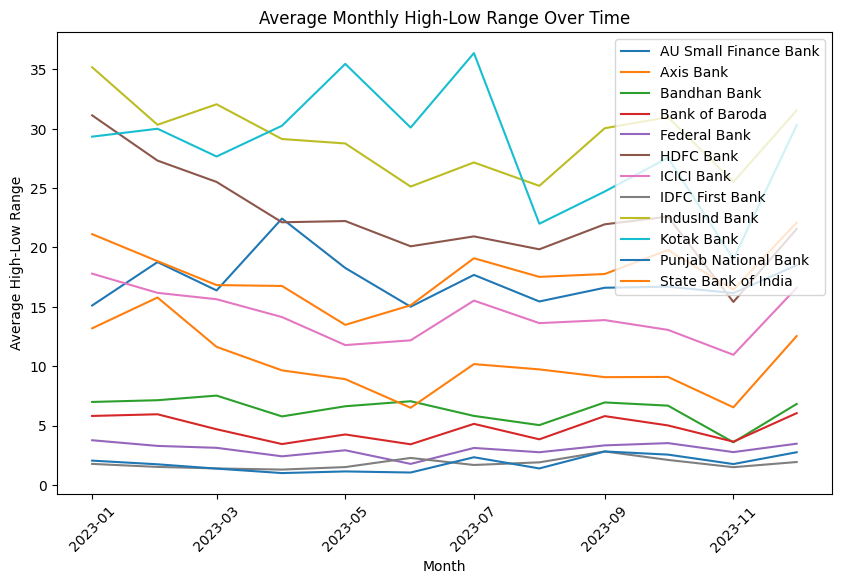

In [15]:
# Calculate daily high-low range
df['Date'] = pd.to_datetime(df['Date'])
df['Month'] = df['Date'].dt.strftime('%Y-%m')
df['High-Low Range'] = df['High'] - df['Low']

# Group by Index and Month, and calculate the mean of the high-low range
monthly_avg_range = df.groupby(['Index', 'Month'])['High-Low Range'].mean().reset_index()

# Convert the Month column back to datetime for proper plotting
monthly_avg_range['Month'] = pd.to_datetime(monthly_avg_range['Month'])

# Plot the average high-low range for each month
plt.figure(figsize=(10, 6))
for Index in monthly_avg_range['Index'].unique():
    Index_data = monthly_avg_range[monthly_avg_range['Index'] == Index]
    plt.plot(Index_data['Month'], Index_data['High-Low Range'], label=Index)

plt.title('Average Monthly High-Low Range Over Time')
plt.xlabel('Month')
plt.ylabel('Average High-Low Range')
plt.xticks(rotation=45)
plt.legend()
plt.show()


In [27]:
# Calculate annual growth rate (ROI)
df['Yearly ROI (%)'] = df.groupby('Index')['Close'].transform(lambda x: (x.iloc[-1] - x.iloc[0]) / x.iloc[0] * 100)

# Summary of ROI per Index
roi_summary = df.groupby('Index')['Yearly ROI (%)'].first()
print(roi_summary)


Index
AU Small Finance Bank    19.832509
Axis Bank                17.154383
Bandhan Bank              0.499693
Bank of Baroda           24.080540
Federal Bank             13.367243
HDFC Bank                 4.941227
ICICI Bank               10.348839
IDFC First Bank          45.482818
IndusInd Bank            30.272284
Kotak Bank                4.504751
Punjab National Bank     67.611546
State Bank of India       4.850962
Name: Yearly ROI (%), dtype: float64


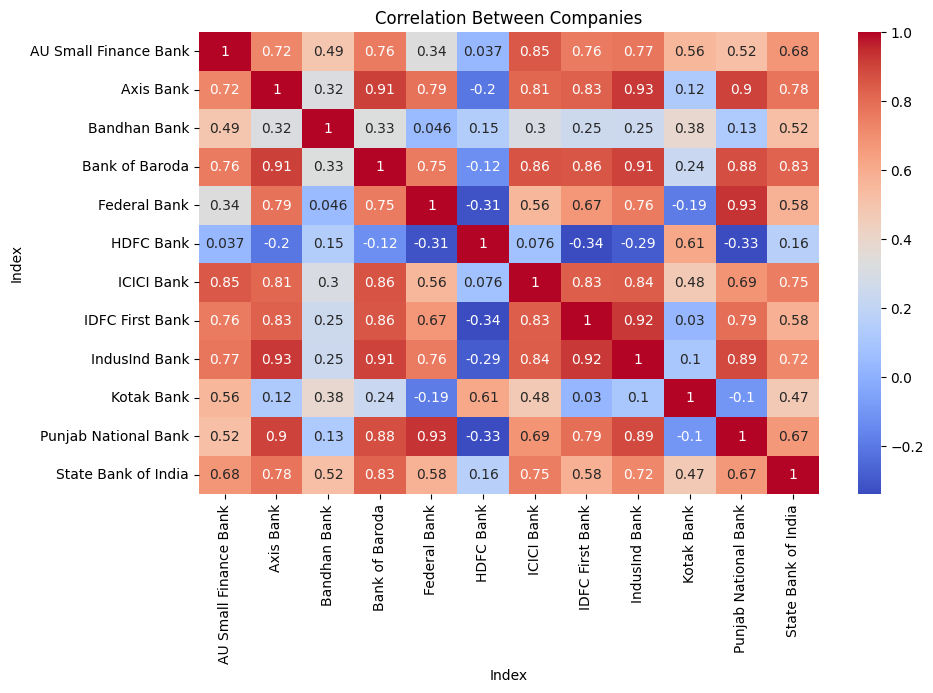

In [29]:
# Pivot the data so that each Index's Close prices are columns
close_prices = df.pivot(index='Date', columns='Index', values='Close')

# Correlation between companies
Index_correlation = close_prices.corr()

# Plot heatmap of Index correlation
plt.figure(figsize=(10, 6))
sns.heatmap(Index_correlation, annot=True, cmap='coolwarm')
plt.title('Correlation Between Companies')
plt.show()


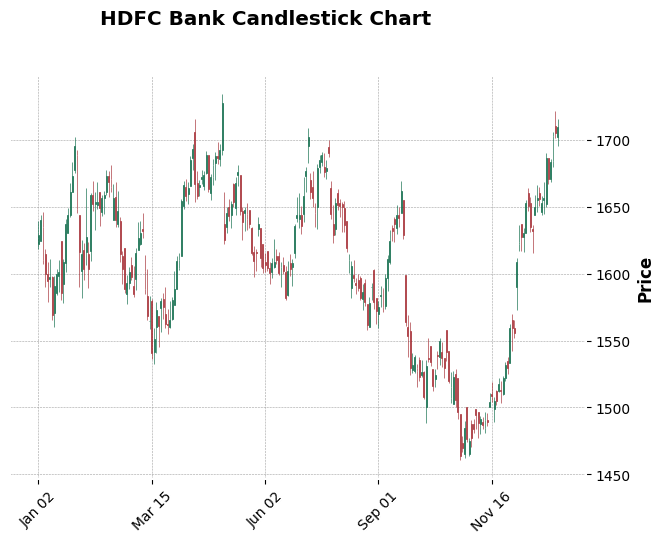

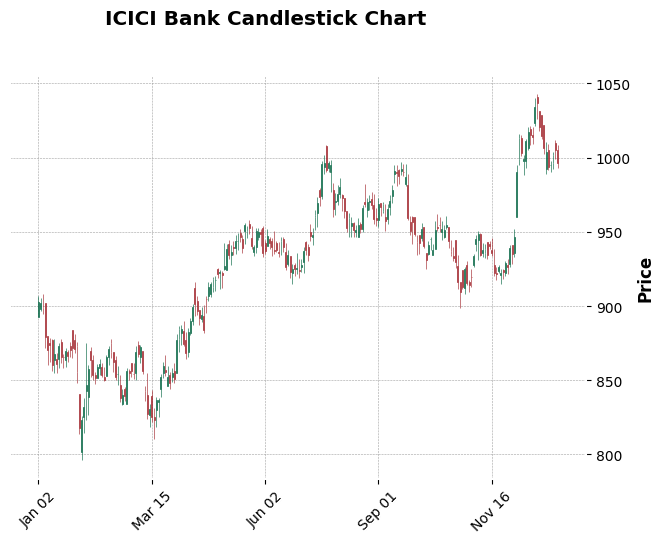

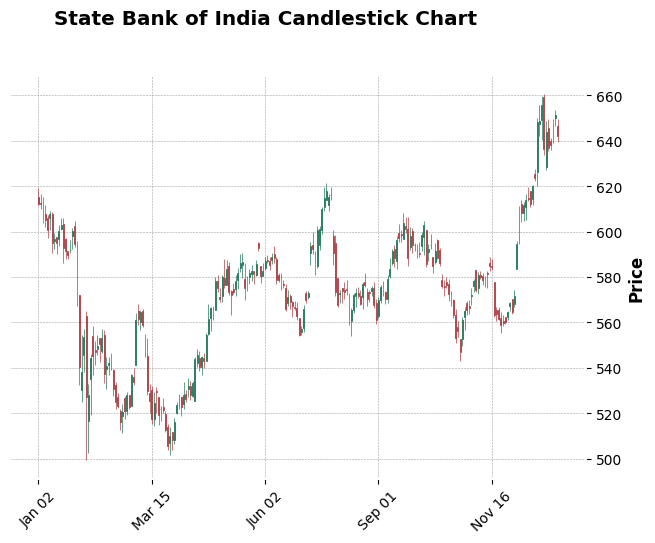

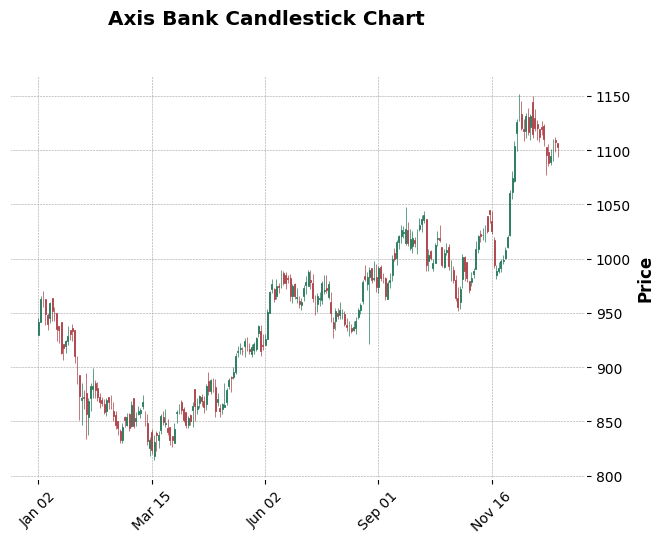

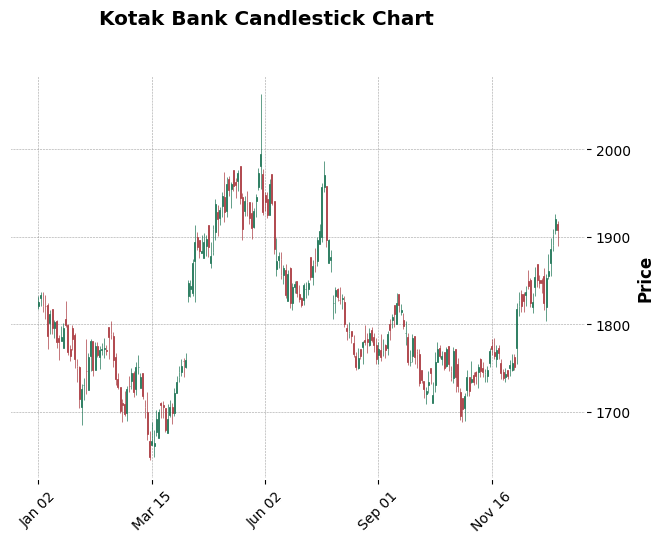

...

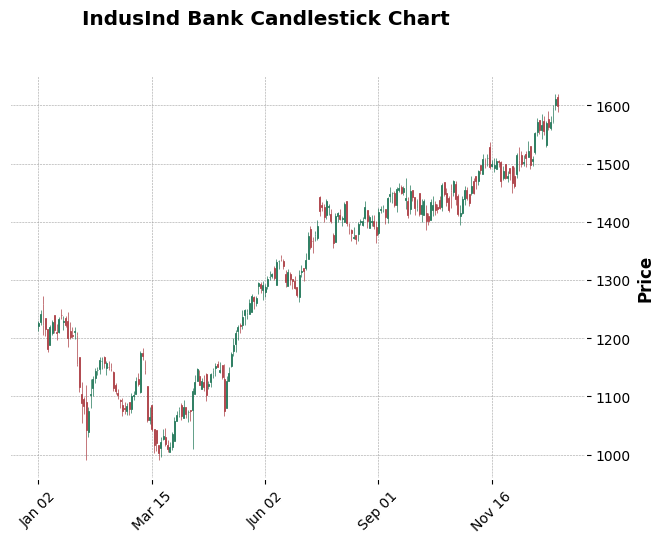

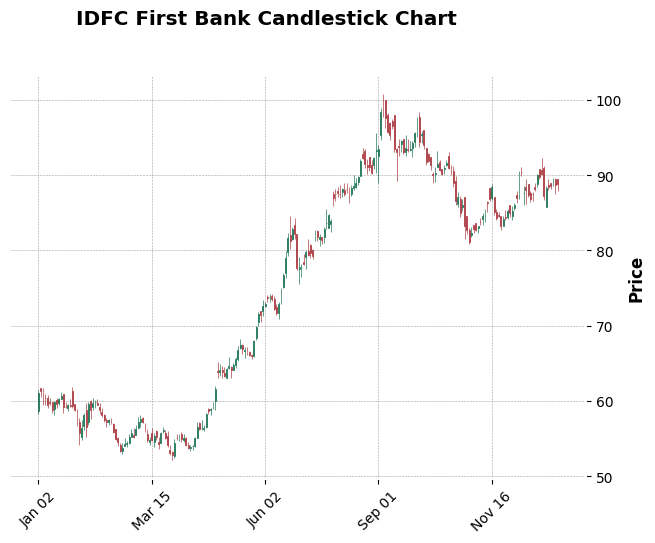

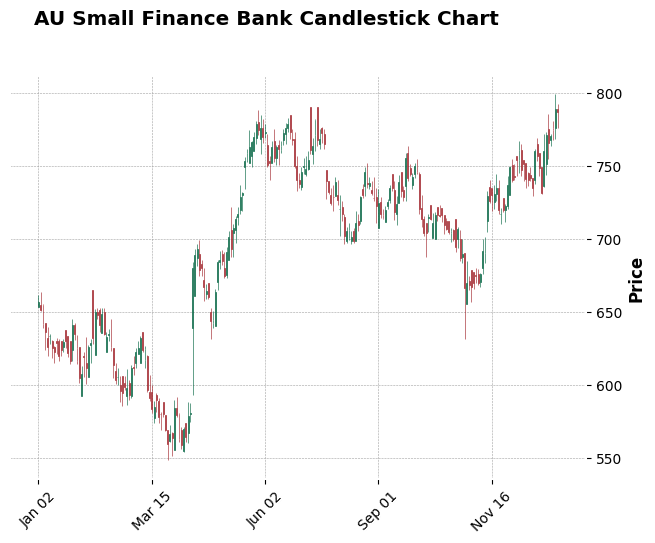

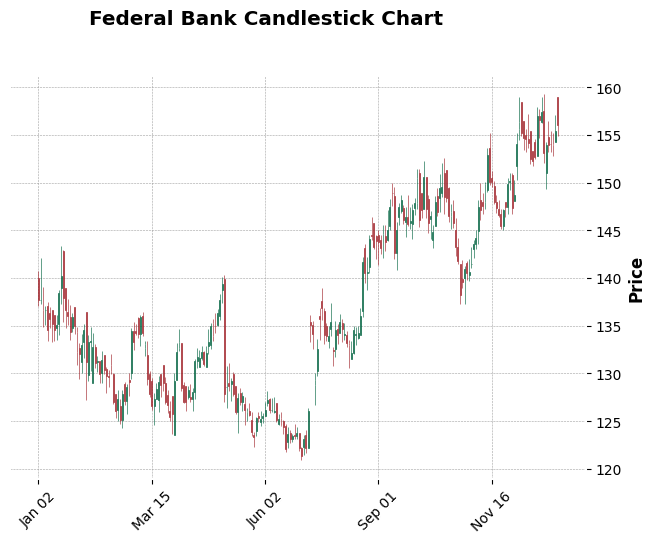

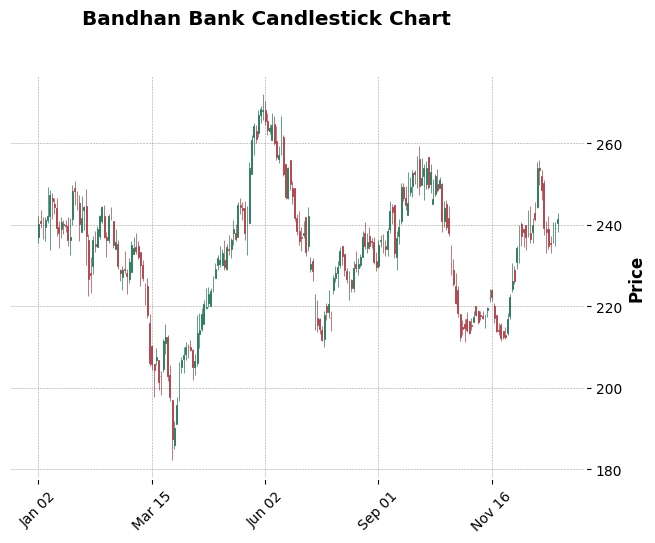

In [16]:
import mplfinance as mpf

for Index in df['Index'].unique():
    Index_data = df[df['Index'] == Index].set_index('Date')
    Index_data.index = pd.to_datetime(Index_data.index)
    Index_data = Index_data[['Open', 'High', 'Low', 'Close']]
    
    # Plot candlestick chart
    mpf.plot(Index_data, type='candle', title=f'{Index} Candlestick Chart', style='charles')


In [33]:
# Identify unusually high volume
high_volume_days = df[df['Close'] > df['Close'].quantile(0.95)]
high_volume_days


,Date,Index,Open,High,Low,Close,MA_7,MA_30,Daily Change (%),High-Low Range,Yearly ROI (%)
920,2023-01-02,Kotak Bank,1820.199951,1832.500000,1817.000000,1825.849976,NaN,NaN,NaN,15.500000,4.504751
921,2023-01-03,Kotak Bank,1830.449951,1836.500000,1820.449951,1833.000000,NaN,NaN,0.391600,16.050049,4.504751
922,2023-01-04,Kotak Bank,1836.500000,1836.500000,1814.099976,1820.849976,NaN,NaN,-0.662849,22.400024,4.504751
923,2023-01-05,Kotak Bank,1821.000000,1832.949951,1806.199951,1820.599976,NaN,NaN,-0.013730,26.750000,4.504751
924,2023-01-06,Kotak Bank,1822.050049,1824.500000,1771.000000,1786.900024,NaN,NaN,-1.851035,53.500000,4.504751
...,...,...,...,...,...,...,...,...,...,...,...
1145,2023-12-22,Kotak Bank,1855.000000,1879.900024,1851.550049,1861.300049,1848.121443,1795.568339,0.437087,28.349976,4.504751
1146,2023-12-26,Kotak Bank,1869.900024,1899.000000,1855.500000,1886.349976,1852.828578,1800.268339,1.345830,43.500000,4.504751
1147,2023-12-27,Kotak Bank,1890.050049,1909.000000,1883.949951,1902.599976,1860.335711,1805.525004,0.861452,25.050049,4.504751
1148,2023-12-28,Kotak Bank,1908.000000,1926.000000,1902.750000,1919.900024,1870.785714,1811.278337,0.909285,23.250000,4.504751


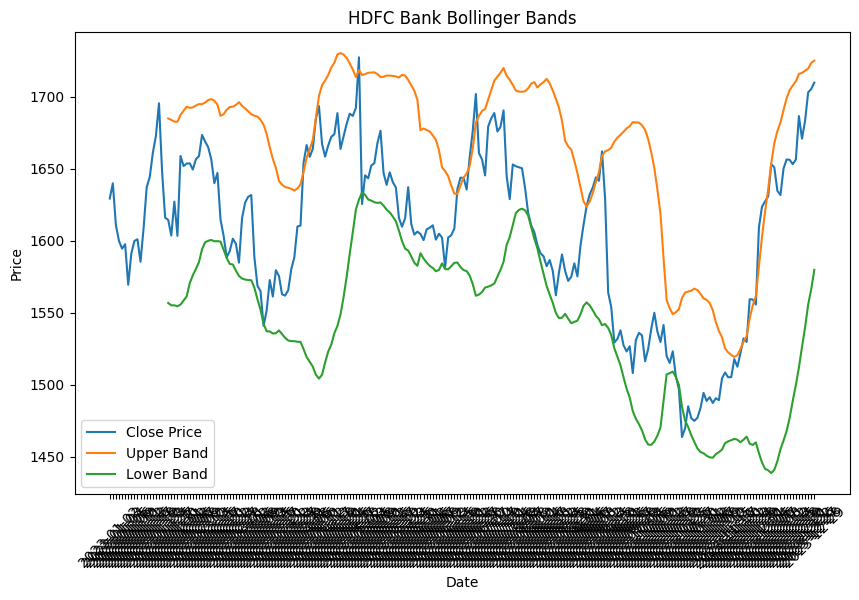

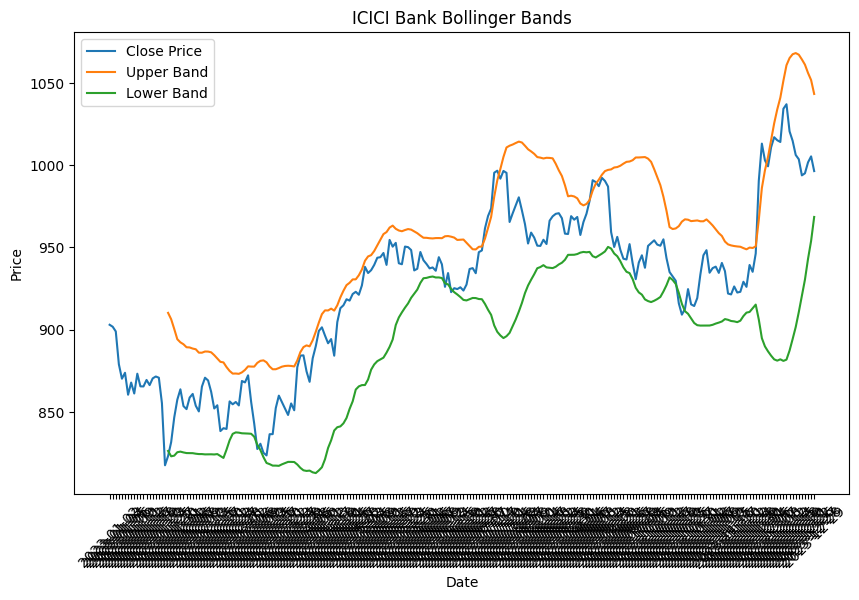

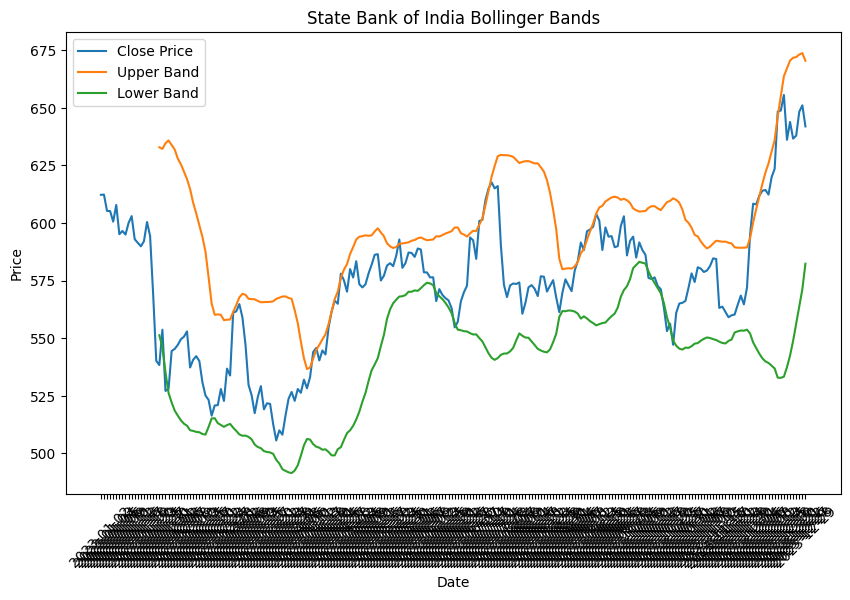

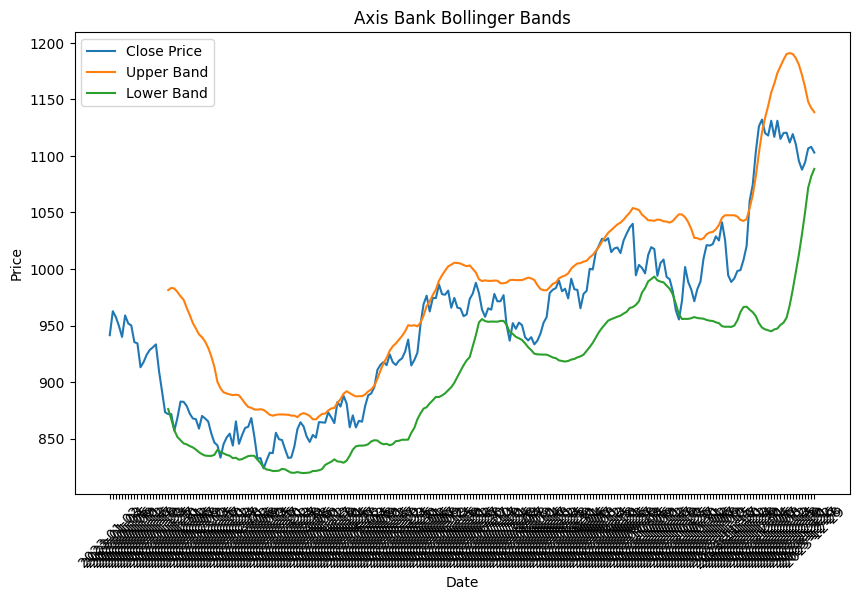

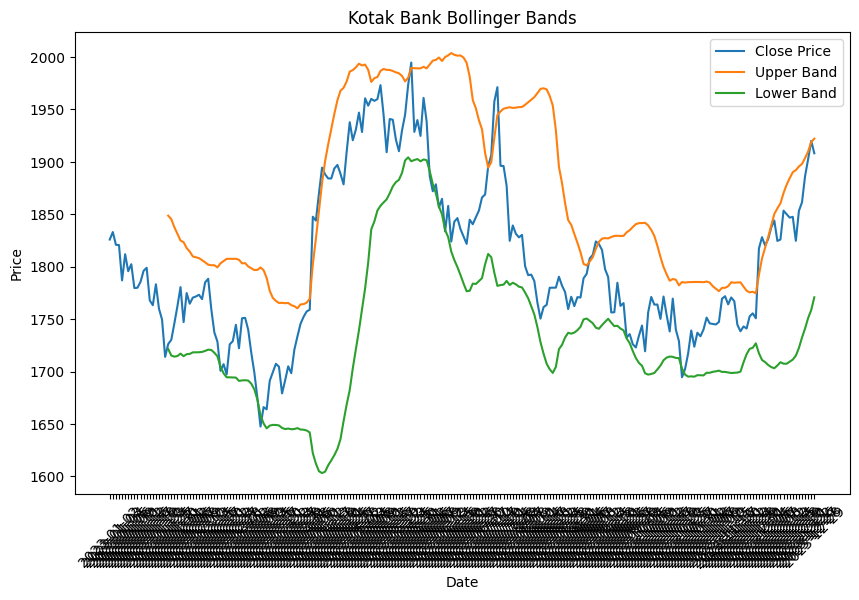

...

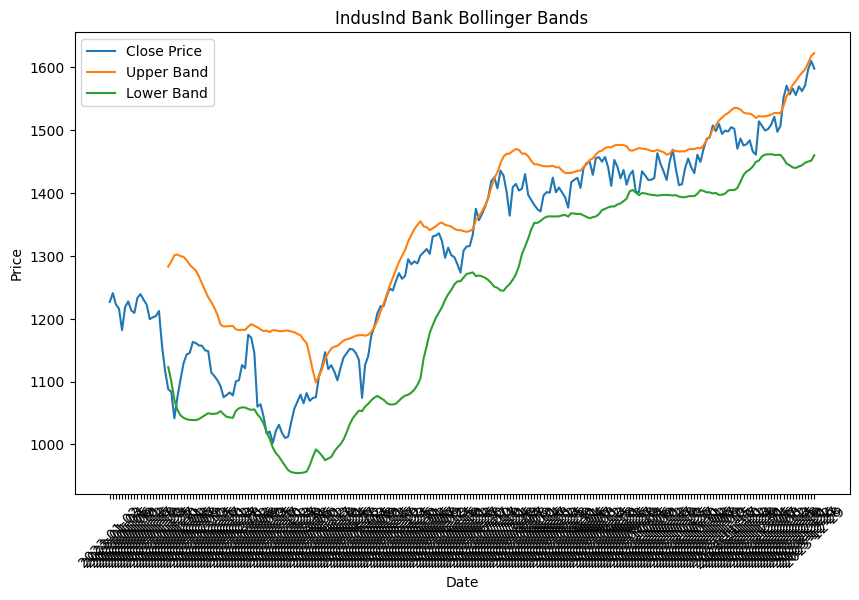

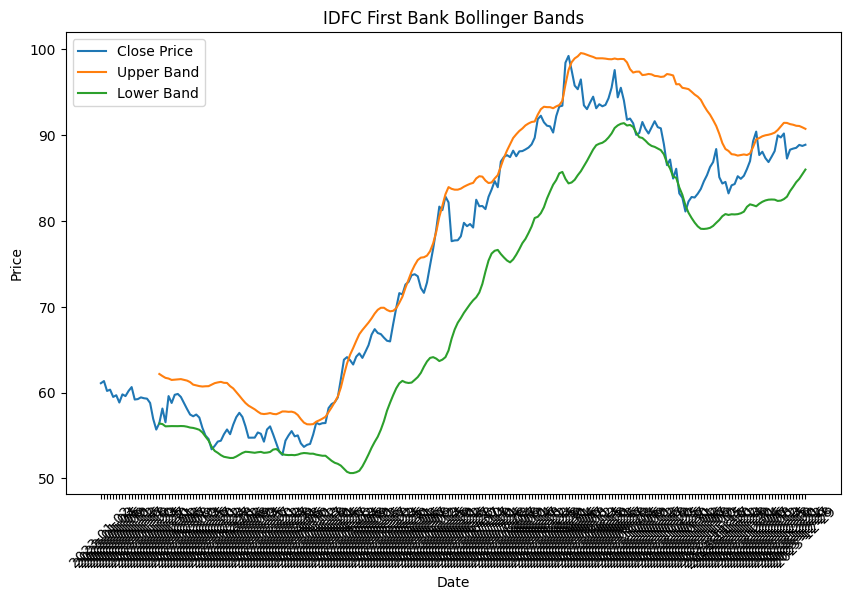

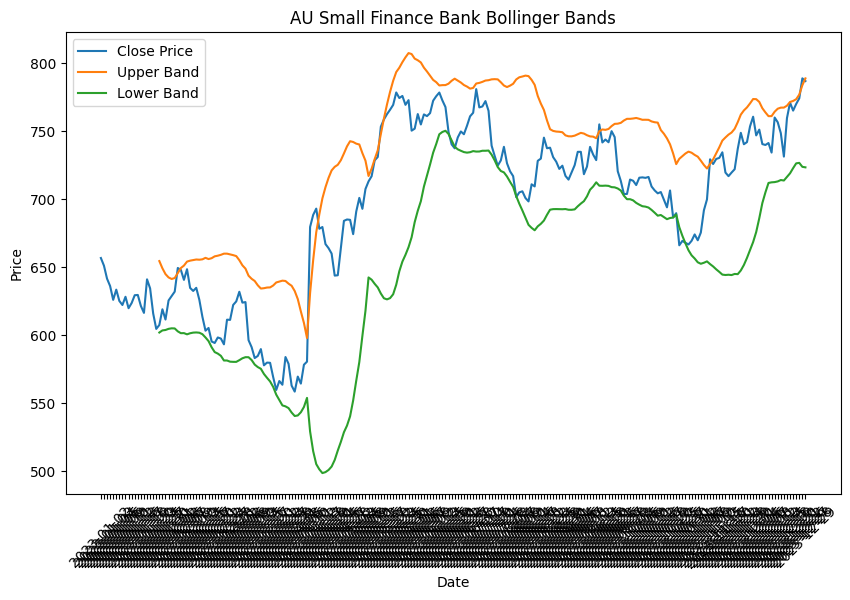

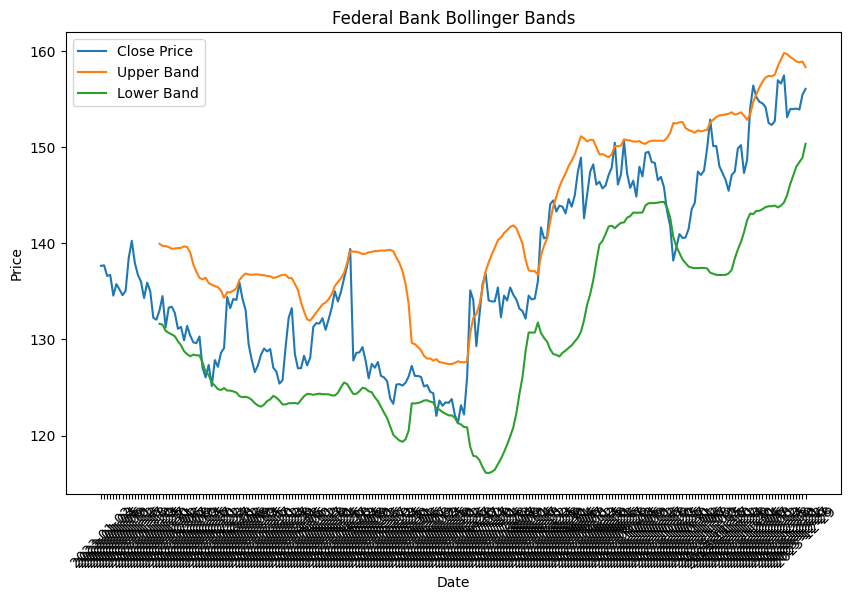

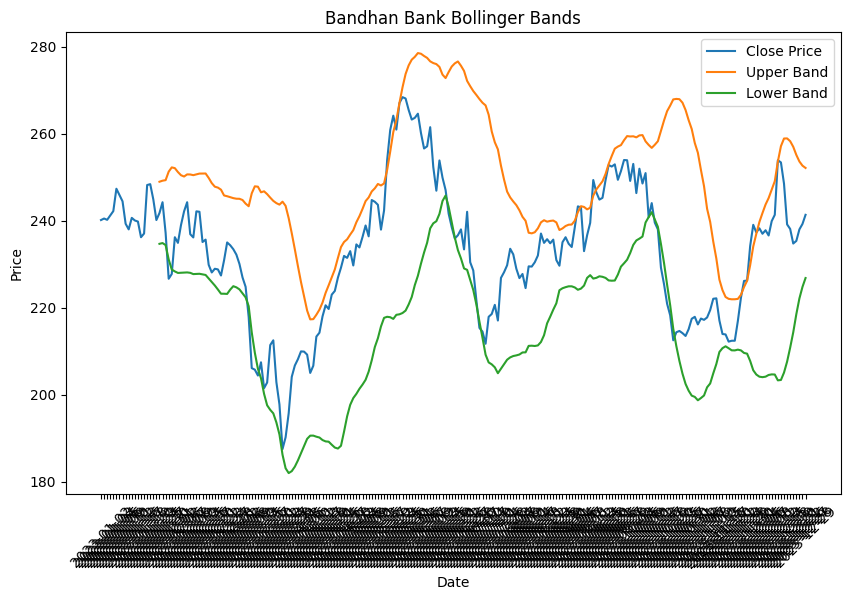

In [35]:
# Bollinger Bands
df['20 Day MA'] = df.groupby('Index')['Close'].transform(lambda x: x.rolling(window=20).mean())
df['20 Day Std'] = df.groupby('Index')['Close'].transform(lambda x: x.rolling(window=20).std())
df['Upper Band'] = df['20 Day MA'] + (df['20 Day Std'] * 2)
df['Lower Band'] = df['20 Day MA'] - (df['20 Day Std'] * 2)

# Plot Bollinger Bands for each Index
for Index in df['Index'].unique():
    Index_data = df[df['Index'] == Index]
    plt.figure(figsize=(10, 6))
    plt.plot(Index_data['Date'], Index_data['Close'], label='Close Price')
    plt.plot(Index_data['Date'], Index_data['Upper Band'], label='Upper Band')
    plt.plot(Index_data['Date'], Index_data['Lower Band'], label='Lower Band')
    plt.title(f'{Index} Bollinger Bands')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()


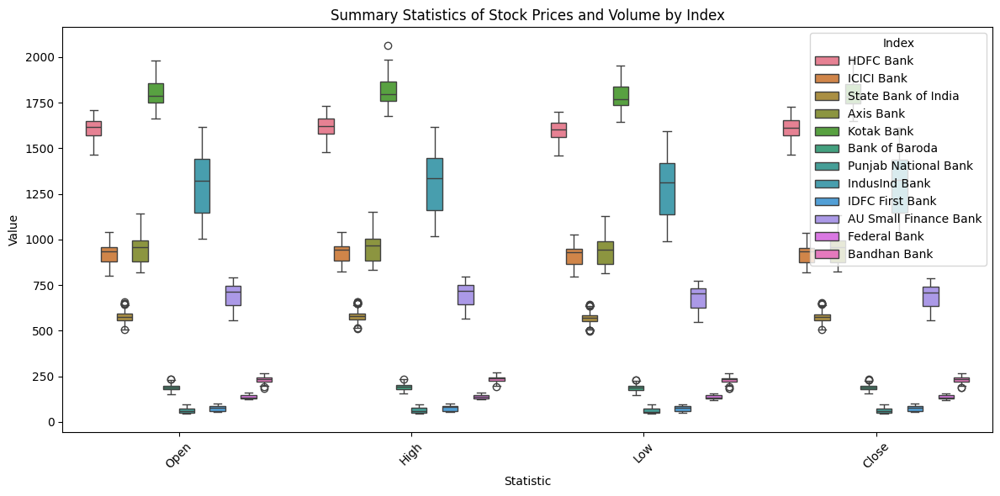

In [38]:
# Melt the dataframe for easier plotting
melted_df = df.melt(id_vars=["Index"], value_vars=["Open", "High", "Low", "Close"])

# Set plot size
plt.figure(figsize=(12, 6))

# Create a boxplot for each Index
sns.boxplot(x='variable', y='value', hue='Index', data=melted_df)

# Set plot title and labels
plt.title('Summary Statistics of Stock Prices and Volume by Index')
plt.xlabel('Statistic')
plt.ylabel('Value')
plt.xticks(rotation=45)

# Show plot
plt.tight_layout()
plt.show()


<Figure size 1200x600 with 0 Axes>

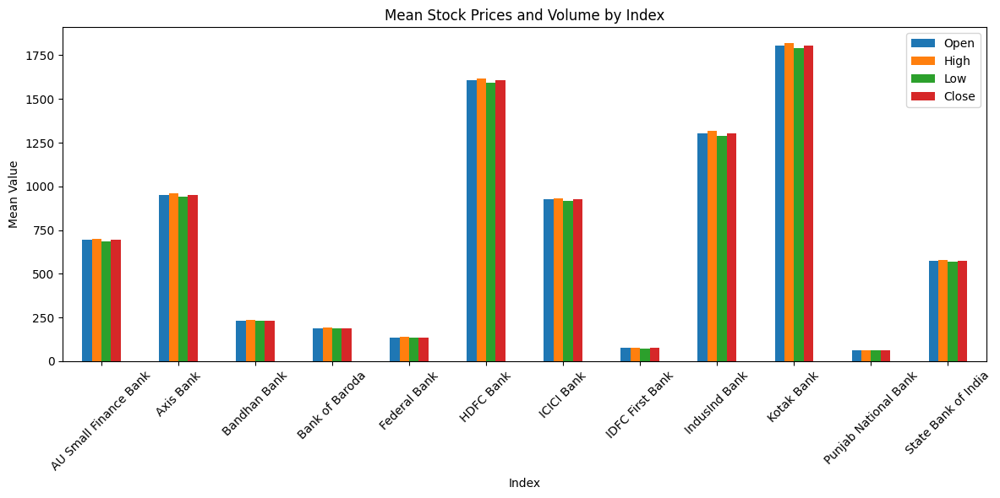

In [42]:
# Group by Index and calculate the mean for each column
mean_stats = df.groupby('Index')[['Open', 'High', 'Low', 'Close']].mean()

# Set plot size
plt.figure(figsize=(12, 6))

# Plot the mean statistics using a bar plot
mean_stats.plot(kind='bar', figsize=(12, 6))

# Set plot title and labels
plt.title('Mean Stock Prices and Volume by Index')
plt.xlabel('Index')
plt.ylabel('Mean Value')
plt.xticks(rotation=45)

# Show plot
plt.tight_layout()
plt.show()


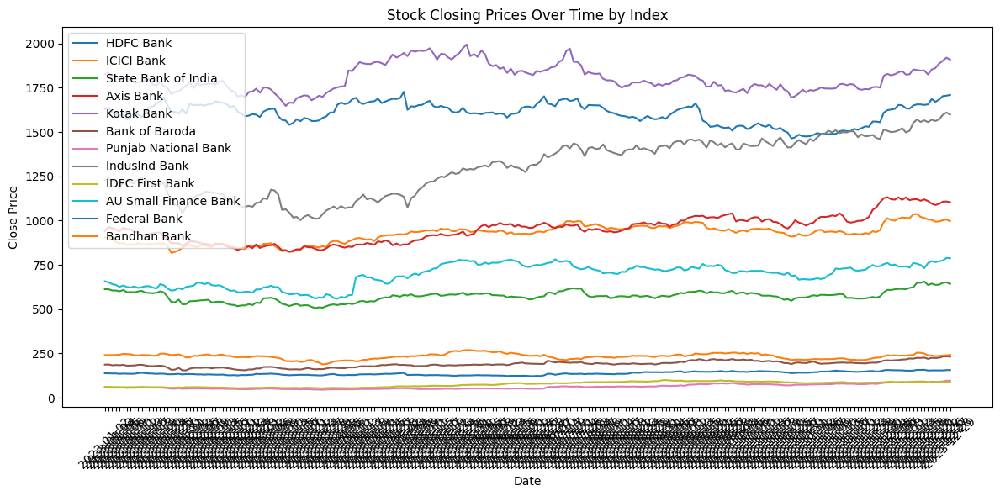

In [43]:
# Set plot size
plt.figure(figsize=(12, 6))

# Line plot for closing prices over time
for Index in df['Index'].unique():
    Index_data = df[df['Index'] == Index]
    plt.plot(Index_data['Date'], Index_data['Close'], label=Index)

# Set plot title and labels
plt.title('Stock Closing Prices Over Time by Index')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.xticks(rotation=45)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


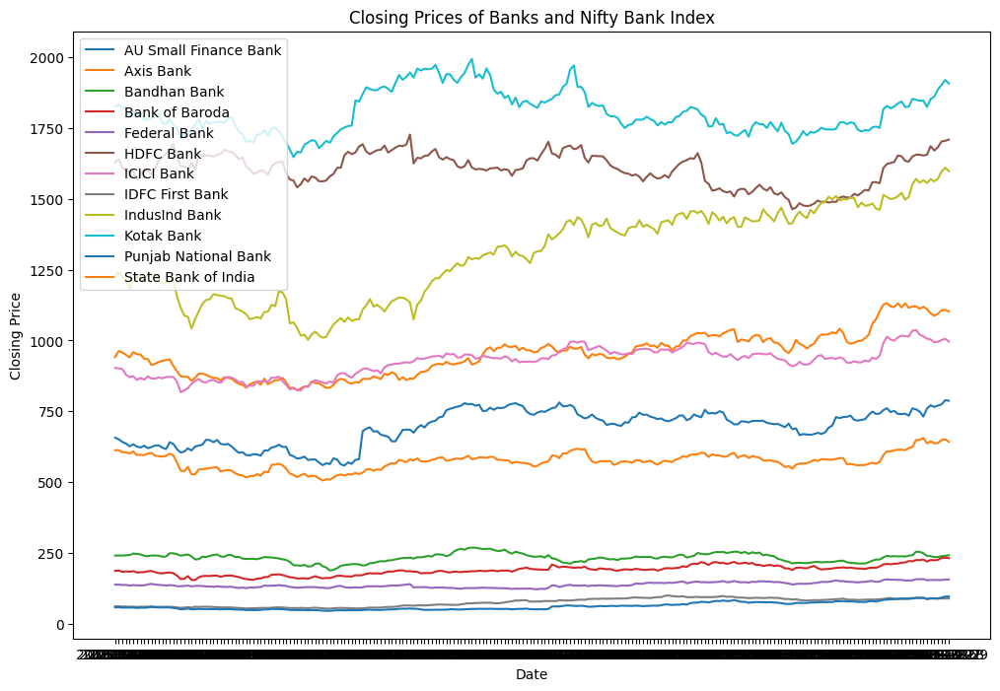

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot closing prices for each bank and Nifty Bank Index
plt.figure(figsize=(12, 8))
for name, group in df.groupby('Index'):
    plt.plot(group['Date'], group['Close'], label=name)

plt.title('Closing Prices of Banks and Nifty Bank Index')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend()
plt.show()


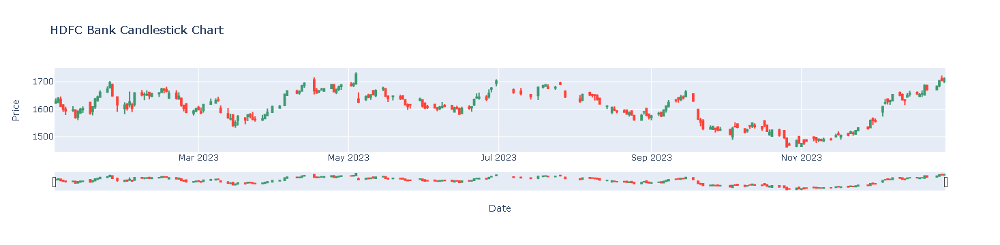

In [47]:
import plotly.graph_objects as go

# Plot a candlestick chart for a specific bank (e.g., HDFC Bank)
df_bank = df[df['Index'] == 'HDFC Bank']
fig = go.Figure(data=[go.Candlestick(x=df_bank['Date'],
                                     open=df_bank['Open'],
                                     high=df_bank['High'],
                                     low=df_bank['Low'],
                                     close=df_bank['Close'])])

fig.update_layout(title='HDFC Bank Candlestick Chart', xaxis_title='Date', yaxis_title='Price')
fig.show()


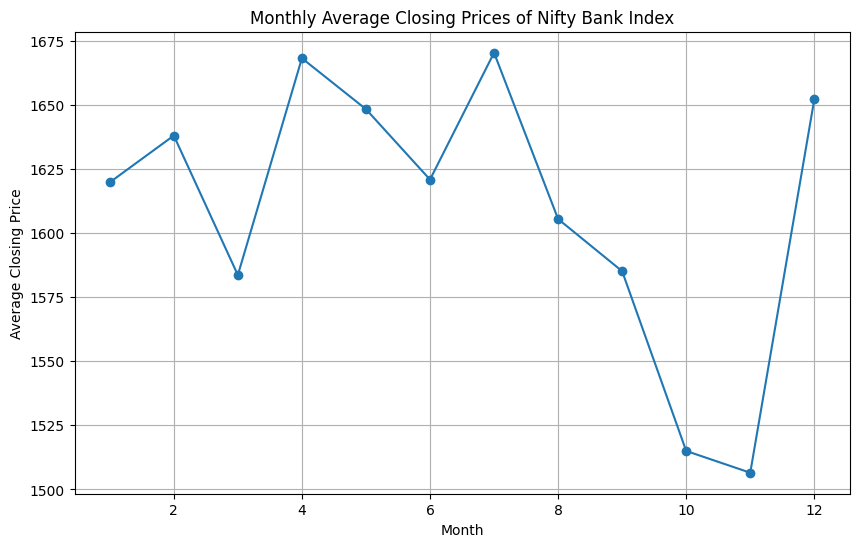

In [49]:
# Extract month and calculate monthly average closing prices for each bank
df['Month'] = pd.to_datetime(df['Date']).dt.month
monthly_trends = df.groupby(['Index', 'Month']).agg({'Close': 'mean'}).reset_index()

# Plot monthly trends for Nifty Bank Index
nifty_monthly = monthly_trends[monthly_trends['Index'] == 'HDFC Bank']
plt.figure(figsize=(10, 6))
plt.plot(nifty_monthly['Month'], nifty_monthly['Close'], marker='o')
plt.title('Monthly Average Closing Prices of Nifty Bank Index')
plt.xlabel('Month')
plt.ylabel('Average Closing Price')
plt.grid(True)
plt.show()


In [52]:
# Calculate yearly percentage change for each bank
df['yearly_return'] = df.groupby('Index')['Close'].transform(lambda x: (x.iloc[-1] - x.iloc[0]) / x.iloc[0] * 100)

# Rank banks based on yearly percentage change
yearly_performance = df.groupby('Index')['yearly_return'].last().sort_values(ascending=False)
print(yearly_performance)


Index
Punjab National Bank     67.611546
IDFC First Bank          45.482818
IndusInd Bank            30.272284
Bank of Baroda           24.080540
AU Small Finance Bank    19.832509
Axis Bank                17.154383
Federal Bank             13.367243
ICICI Bank               10.348839
HDFC Bank                 4.941227
State Bank of India       4.850962
Kotak Bank                4.504751
Bandhan Bank              0.499693
Name: yearly_return, dtype: float64


In [62]:
df['daily_return'] = df['Close'].pct_change()

In [65]:
df['cumulative_return'] = (1+df['daily_return']).cumprod()


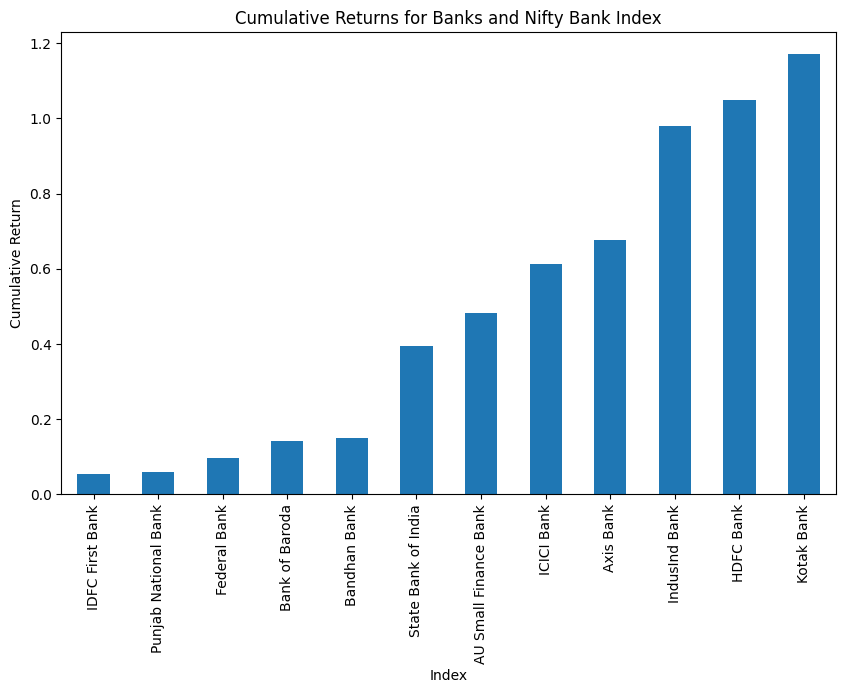

In [66]:
# Bar chart for cumulative returns at the end of the year
cumulative_returns_end = df.groupby('Index')['cumulative_return'].last().sort_values()
cumulative_returns_end.plot(kind='bar', figsize=(10, 6), title='Cumulative Returns for Banks and Nifty Bank Index')
plt.ylabel('Cumulative Return')
plt.show()


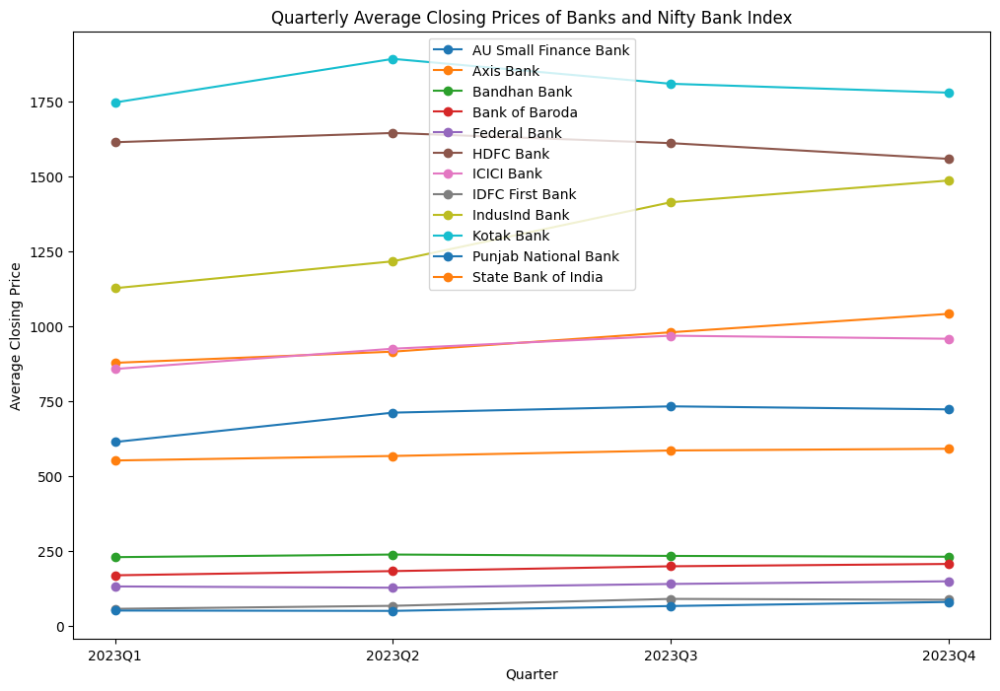

In [70]:
# Group data by bank and quarter, and compute mean closing prices
df['quarter'] = pd.to_datetime(df['Date']).dt.to_period('Q')
quarterly_trends = df.groupby(['Index', 'quarter']).agg({'Close': 'mean'}).reset_index()

# Plot quarterly trends for all banks
plt.figure(figsize=(12, 8))
for name, group in quarterly_trends.groupby('Index'):
    plt.plot(group['quarter'].astype(str), group['Close'], marker='o', label=name)

plt.title('Quarterly Average Closing Prices of Banks and Nifty Bank Index')
plt.xlabel('Quarter')
plt.ylabel('Average Closing Price')
plt.legend()
plt.show()


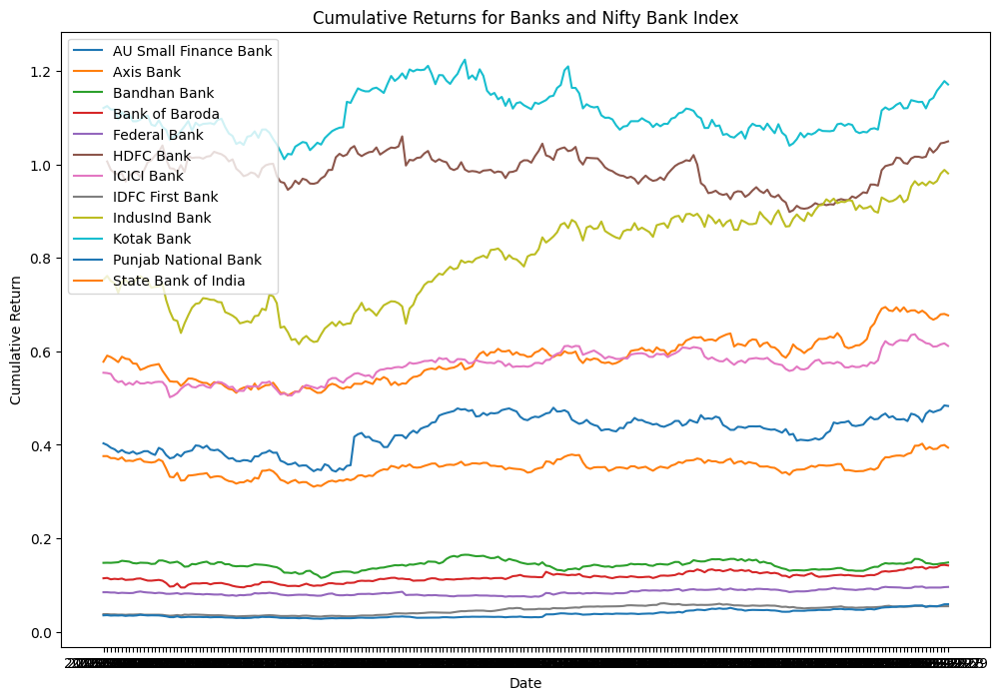

In [68]:
# Plot cumulative returns over time for each bank and Nifty Bank Index
plt.figure(figsize=(12, 8))
for name, group in df.groupby('Index'):
    plt.plot(group['Date'], group['cumulative_return'], label=name)

plt.title('Cumulative Returns for Banks and Nifty Bank Index')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.legend()
plt.show()
